In [1]:
import torch
import os
import numpy as np
import cv2
import scipy

import matplotlib.pyplot as plt

from scipy.ndimage import convolve

In [3]:
%matplotlib inline

%load_ext autoreload
%autoreload 2

In [42]:
from test_batch import box_distance, collect_predict,cache_to_arrowed, test_arrow, draw_predict_single,load_predict,smooth_predict

In [86]:
collected = collect_predict("output003_cache", pixel_threshold = 60, verbose=True,
                    K_size = 60, K_delta_size=40)

141 chain detected


In [87]:
sorted([len(chain) for chain in collected['chain_list']], reverse=True)[:20]

[2907,
 1429,
 906,
 658,
 216,
 117,
 115,
 71,
 65,
 47,
 32,
 29,
 19,
 17,
 17,
 16,
 14,
 12,
 12,
 12]

In [88]:
predict_cache,predict_cache_map,chain_list,id2key,key2id = collected['predict_cache'],collected['predict_cache_map'],collected['chain_list'],collected['id2key'],collected['key2id']

In [89]:
len(predict_cache)

15000

In [90]:
predict_cache[1034]

[{'score': tensor(0.9349, device='cpu'),
  'label_name': 'boat',
  'pt': array([1844.961  ,  508.59616, 2996.834  , 1280.2415 ], dtype=float32),
  'matched': True,
  'pt_smoothed': array([1855.014  ,  531.23755, 2961.438  , 1283.0524 ], dtype=float32),
  'pt_smoothed_next': array([1855.7546 ,  531.96094, 2963.486  , 1284.6163 ], dtype=float32),
  'pt_next': array([1845.0952,  508.3675, 2993.6228, 1275.4344], dtype=float32),
  'delta': array([1.3942871, 1.1436768], dtype=float32),
  'delta_smoothed': array([1.5325317, 1.2826614], dtype=float32)},
 {'score': tensor(0.6686, device='cpu'),
  'label_name': 'boat',
  'pt': array([1712.8506 ,  347.74857, 1907.5935 ,  491.8745 ], dtype=float32),
  'matched': True,
  'head': True,
  'pt_smoothed': array([1720.6522 ,  345.9438 , 1913.1613 ,  492.95026], dtype=float32),
  'pt_smoothed_next': array([1721.1448 ,  345.94336, 1913.449  ,  493.04355], dtype=float32),
  'pt_next': array([1713.2632 ,  348.34518, 1910.8416 ,  491.15982], dtype=float32),


In [91]:
predict_cache_map[id2key[1034]]

[{'score': tensor(0.9349, device='cpu'),
  'label_name': 'boat',
  'pt': array([1844.961  ,  508.59616, 2996.834  , 1280.2415 ], dtype=float32),
  'matched': True,
  'pt_smoothed': array([1855.014  ,  531.23755, 2961.438  , 1283.0524 ], dtype=float32),
  'pt_smoothed_next': array([1855.7546 ,  531.96094, 2963.486  , 1284.6163 ], dtype=float32),
  'pt_next': array([1845.0952,  508.3675, 2993.6228, 1275.4344], dtype=float32),
  'delta': array([1.3942871, 1.1436768], dtype=float32),
  'delta_smoothed': array([1.5325317, 1.2826614], dtype=float32)},
 {'score': tensor(0.6686, device='cpu'),
  'label_name': 'boat',
  'pt': array([1712.8506 ,  347.74857, 1907.5935 ,  491.8745 ], dtype=float32),
  'matched': True,
  'head': True,
  'pt_smoothed': array([1720.6522 ,  345.9438 , 1913.1613 ,  492.95026], dtype=float32),
  'pt_smoothed_next': array([1721.1448 ,  345.94336, 1913.449  ,  493.04355], dtype=float32),
  'pt_next': array([1713.2632 ,  348.34518, 1910.8416 ,  491.15982], dtype=float32),


In [92]:
box_distance(predict_cache_map[id2key[1034]][0], predict_cache_map[id2key[1034]][1])

773.41876

In [93]:
np.linalg.norm(np.array([(1844.961+2996.834)/2,(508.59616+1280.2415)/2]) - np.array([(1712.8506+1907.5935)/2,(347.74857+491.8745)/2]))

773.4187673569344

In [94]:
predict_vanilla=draw_predict_single(id2key[1034], 'output003_cache', 'output003_frames', verbose=True)

{'score': tensor(0.9349, device='cpu'), 'label_name': 'boat', 'pt': array([1844.961  ,  508.59616, 2996.834  , 1280.2415 ], dtype=float32)}
{'score': tensor(0.6686, device='cpu'), 'label_name': 'boat', 'pt': array([1712.8506 ,  347.74857, 1907.5935 ,  491.8745 ], dtype=float32)}


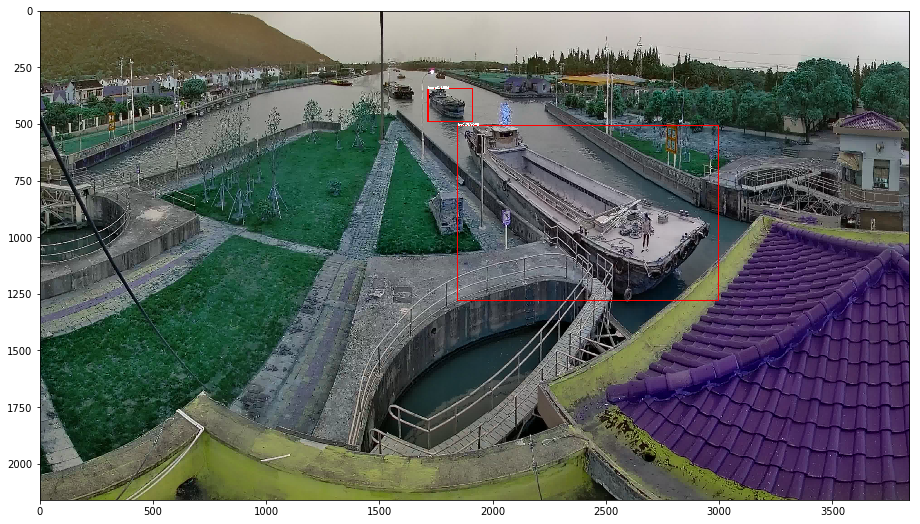

In [95]:
plt.figure(figsize=(16,9))
plt.imshow(predict_vanilla)
plt.show()

In [96]:
img_path = 'output003_frames/{}.jpg'.format(id2key[1034].split('.')[0])
predict_delta_smoothed = test_arrow(id2key[1034], img_path, predict_cache_map, cvt=True, delta_smoothed = True)
predict_nondelta_smoothed = test_arrow(id2key[1034], img_path, predict_cache_map, cvt=True, delta_smoothed = False)

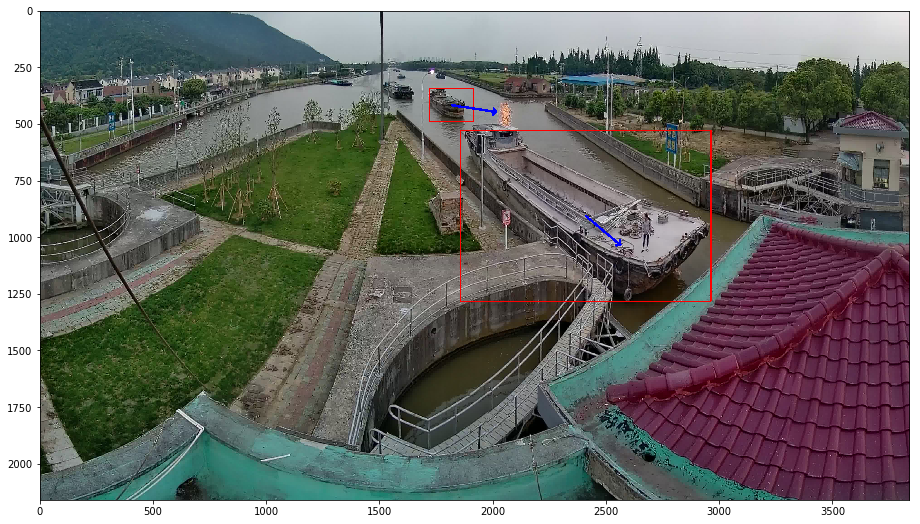

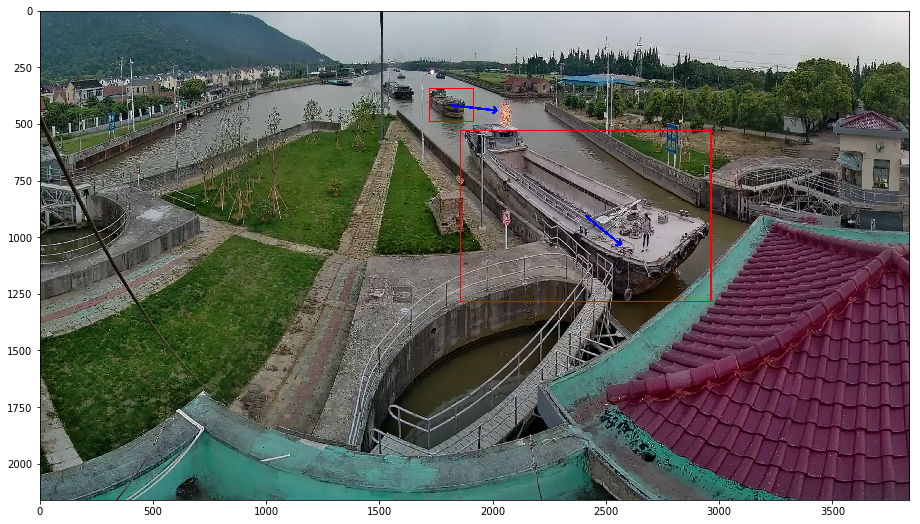

In [97]:
plt.figure(figsize=(16,9))
plt.imshow(predict_delta_smoothed)
plt.show()

plt.figure(figsize=(16,9))
plt.imshow(predict_nondelta_smoothed)
plt.show()


In [98]:
def compare(idx):
    
    predict_vanilla=draw_predict_single(id2key[idx], 'output003_cache', 'output003_frames', verbose=True)
    
    plt.figure(figsize=(16,9))
    plt.imshow(predict_vanilla)
    plt.show()
    
    img_path = 'output003_frames/{}.jpg'.format(id2key[idx].split('.')[0])
    predict_delta_smoothed = test_arrow(id2key[idx], img_path, predict_cache_map, cvt=True, delta_smoothed = True)
    predict_nondelta_smoothed = test_arrow(id2key[idx], img_path, predict_cache_map, cvt=True, delta_smoothed = False)
    
    plt.figure(figsize=(16,9))
    plt.imshow(predict_delta_smoothed)
    plt.show()

    plt.figure(figsize=(16,9))
    plt.imshow(predict_nondelta_smoothed)
    plt.show()


{'score': tensor(0.9349, device='cpu'), 'label_name': 'boat', 'pt': array([1844.961  ,  508.59616, 2996.834  , 1280.2415 ], dtype=float32)}
{'score': tensor(0.6686, device='cpu'), 'label_name': 'boat', 'pt': array([1712.8506 ,  347.74857, 1907.5935 ,  491.8745 ], dtype=float32)}


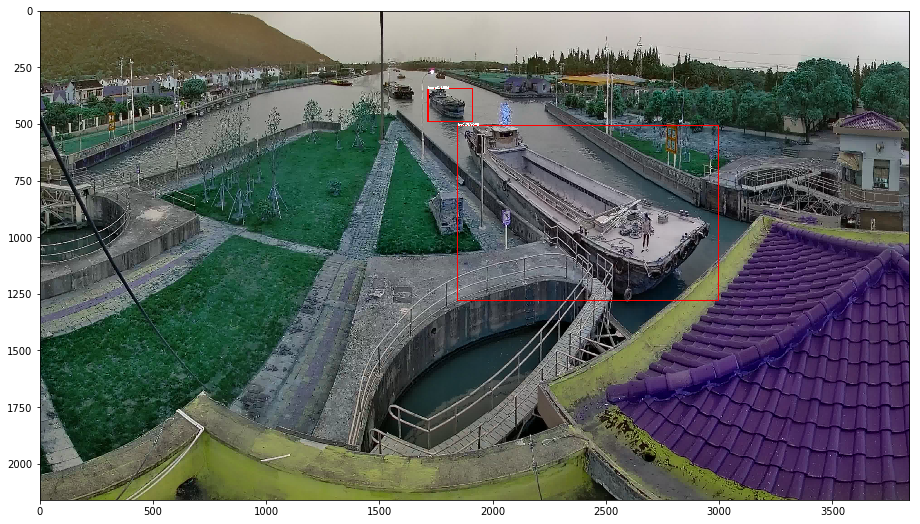

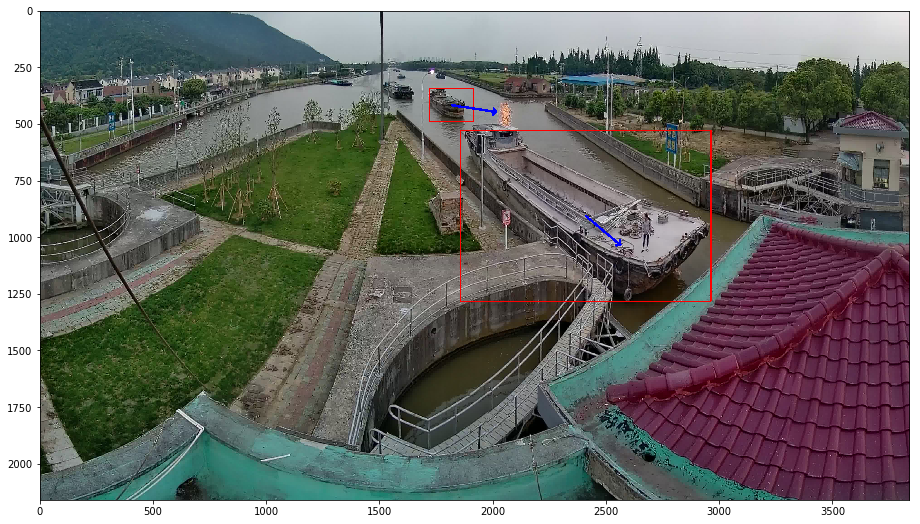

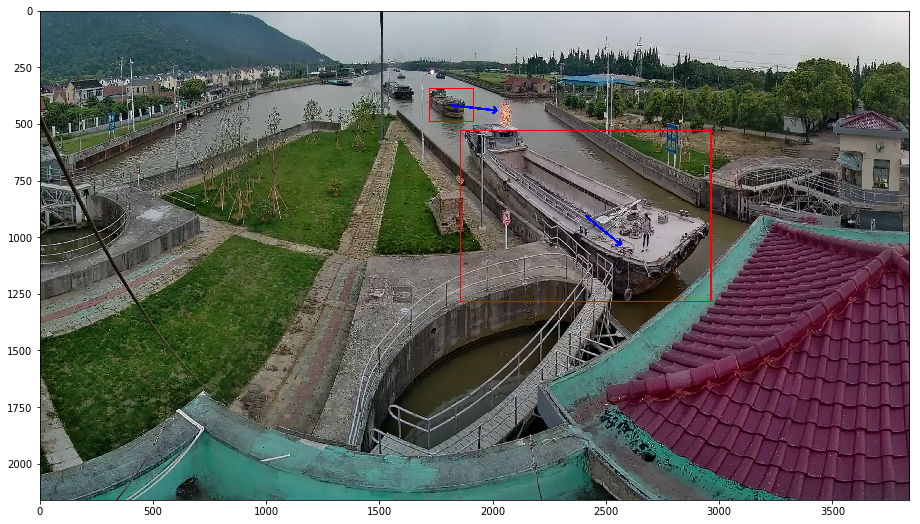

In [99]:
compare(1034)

{'score': tensor(0.9349, device='cpu'), 'label_name': 'boat', 'pt': array([1845.0952,  508.3675, 2993.6228, 1275.4344], dtype=float32)}
{'score': tensor(0.7040, device='cpu'), 'label_name': 'boat', 'pt': array([1713.2632 ,  348.34518, 1910.8416 ,  491.15982], dtype=float32)}


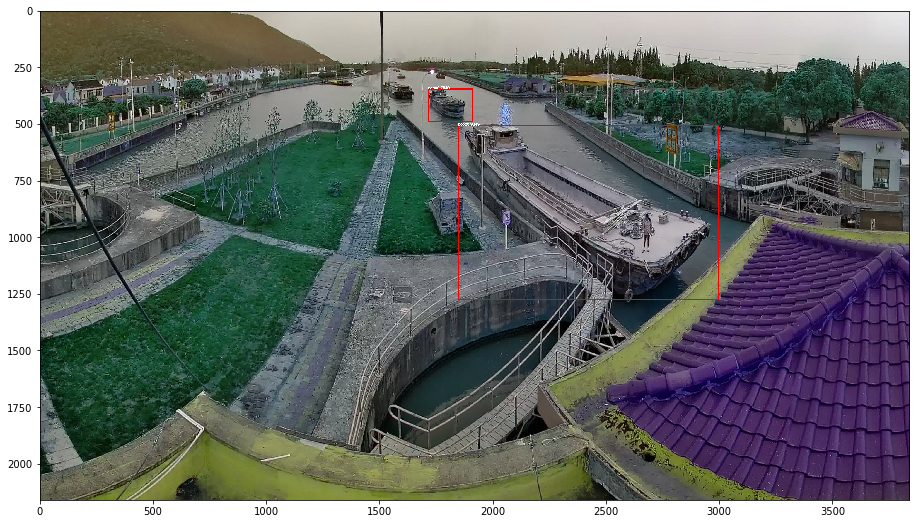

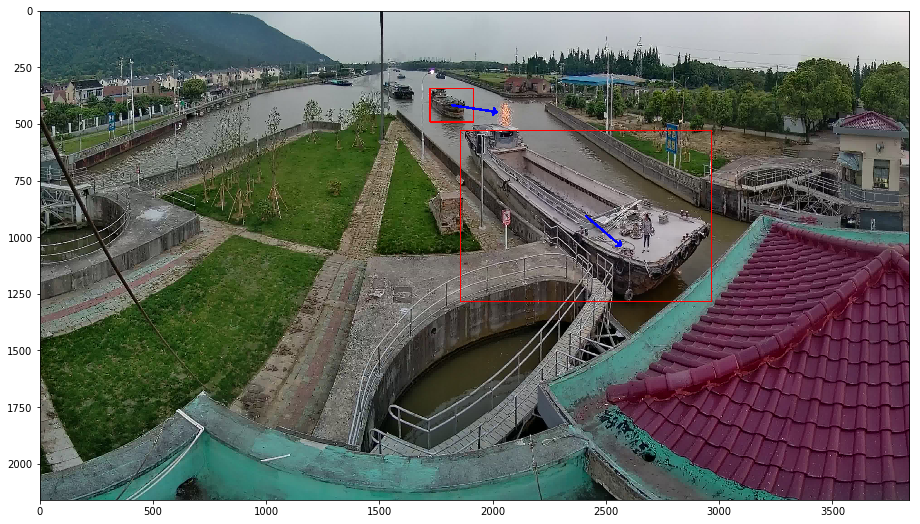

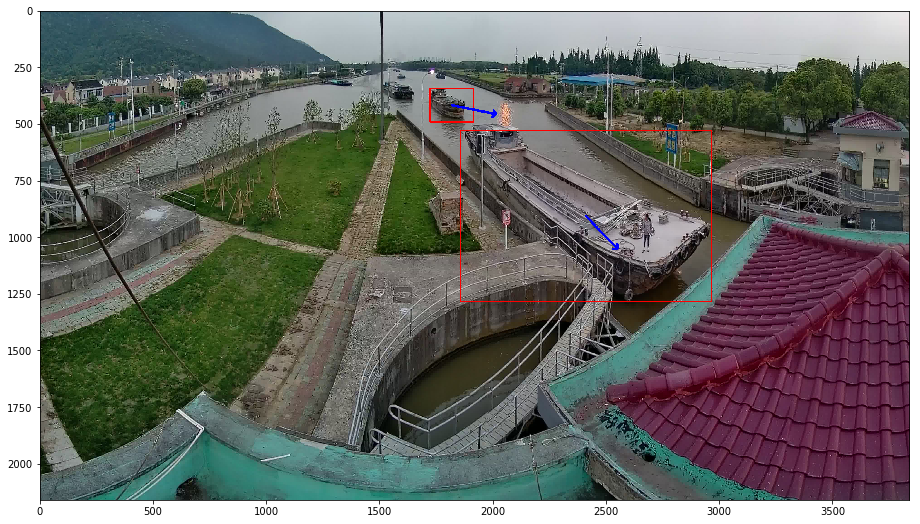

In [100]:
compare(1035)

{'score': tensor(0.9830, device='cpu'), 'label_name': 'boat', 'pt': array([1936.4042 ,  565.89734, 3123.2893 , 1342.2744 ], dtype=float32)}
{'score': tensor(0.6402, device='cpu'), 'label_name': 'boat', 'pt': array([1747.6947,  342.5092, 1954.7053,  505.3755], dtype=float32)}


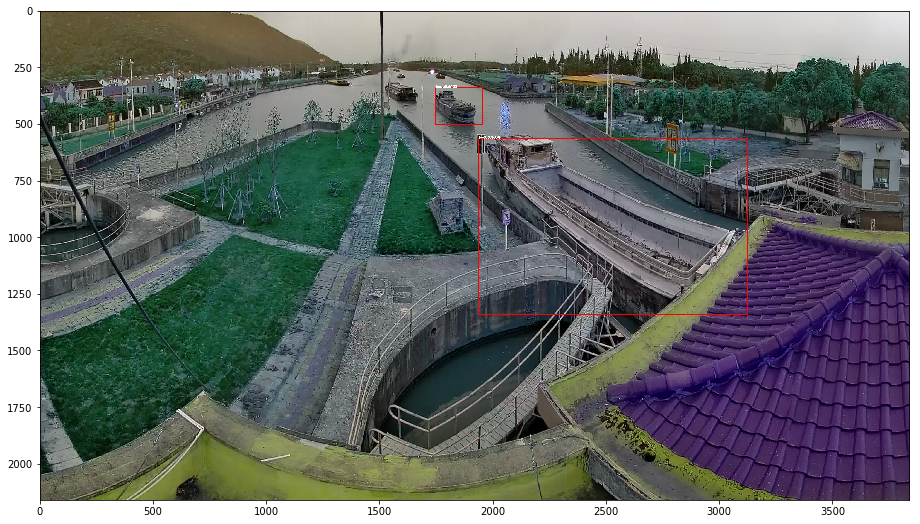

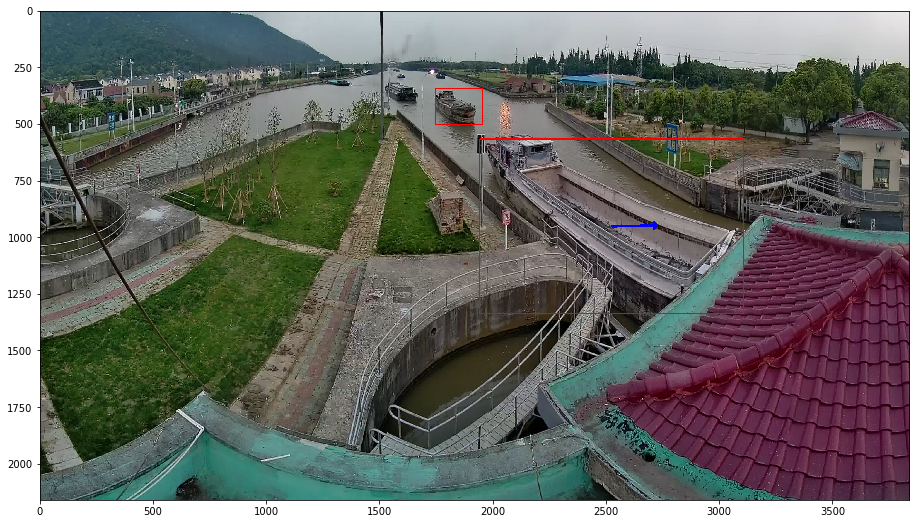

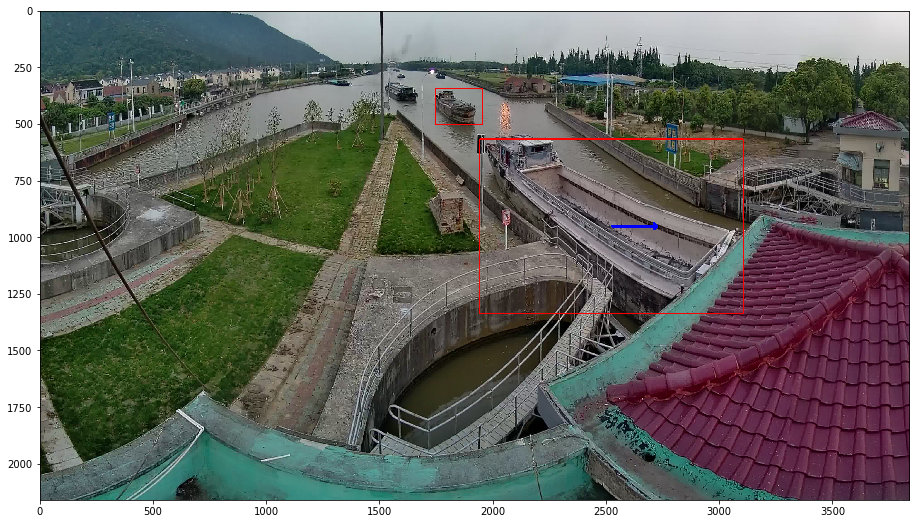

In [101]:
compare(1166)

In [56]:
loaded = load_predict('output003_cache')

In [57]:
import copy

In [59]:
loaded_bk = copy.deepcopy(loaded)

In [63]:
loaded['predict_cache'][0][0]['fucked'] = True

In [64]:
loaded['predict_cache'][0][0]

{'score': tensor(0.6894, device='cpu'),
 'label_name': 'boat',
 'pt': array([1473.6853 ,  314.8148 , 1710.5776 ,  454.76007], dtype=float32),
 'fucked': True}

In [65]:
loaded_bk['predict_cache'][0][0]

{'score': tensor(0.6894, device='cpu'),
 'label_name': 'boat',
 'pt': array([1473.6853 ,  314.8148 , 1710.5776 ,  454.76007], dtype=float32)}

In [66]:
del loaded['predict_cache'][0][0]['fucked']

In [67]:
loaded['predict_cache'][0][0]

{'score': tensor(0.6894, device='cpu'),
 'label_name': 'boat',
 'pt': array([1473.6853 ,  314.8148 , 1710.5776 ,  454.76007], dtype=float32)}

In [107]:
loaded = copy.deepcopy(loaded_bk)
smoothed = smooth_predict(loaded['predict_cache'],pixel_threshold = 60, verbose=True,
                    K_size = 60, K_delta_size=40)
loaded['chain_list'] = smoothed['chain_list']

141 chain detected


In [108]:
loaded['predict_cache'][0]

[{'score': tensor(0.6894, device='cpu'),
  'label_name': 'boat',
  'pt': array([1473.6853 ,  314.8148 , 1710.5776 ,  454.76007], dtype=float32),
  'matched': True,
  'head': True,
  'pt_smoothed': array([1472.1261 ,  313.4971 , 1711.3195 ,  454.84818], dtype=float32),
  'pt_smoothed_next': array([1472.3004 ,  313.5078 , 1711.4188 ,  454.89798], dtype=float32),
  'pt_next': array([1472.1425 ,  315.77893, 1710.8601 ,  453.97778], dtype=float32),
  'delta': array([0.13684082, 0.03024292], dtype=float32),
  'delta_smoothed': array([0.13682862, 0.03024902], dtype=float32)},
 {'score': tensor(0.6024, device='cpu'),
  'label_name': 'boat',
  'pt': array([2840.8416,  890.8509, 3174.3467, 1177.7273], dtype=float32),
  'matched': True,
  'head': True,
  'pt_smoothed': array([2840.8416,  890.8509, 3174.3467, 1177.7273], dtype=float32)}]

In [109]:
loaded2 = copy.deepcopy(loaded_bk)
loaded2['predict_cache'][0]

[{'score': tensor(0.6894, device='cpu'),
  'label_name': 'boat',
  'pt': array([1473.6853 ,  314.8148 , 1710.5776 ,  454.76007], dtype=float32)},
 {'score': tensor(0.6024, device='cpu'),
  'label_name': 'boat',
  'pt': array([2840.8416,  890.8509, 3174.3467, 1177.7273], dtype=float32)}]

In [111]:
#loaded2 = copy.deepcopy(loaded_bk)
for det_list1, det_list2 in zip(loaded['predict_cache'], loaded2['predict_cache']):
    for det1,det2 in zip(det_list1, det_list2):
        det2['pt'] = det1['pt_smoothed'].copy()

In [112]:
smoothed2 = smooth_predict(loaded2['predict_cache'],pixel_threshold = 60, verbose=True,
                    K_size = 60, K_delta_size=40)
loaded2['chain_list'] = smoothed2['chain_list']

140 chain detected


这么看多阶段平滑好像也没什么用。。或者我们试试更低的第一阶段更低的阈值和平滑水平会不会导致更大的第二阶段平滑缩减。

In [116]:
loaded = copy.deepcopy(loaded_bk)
smoothed = smooth_predict(loaded['predict_cache'],pixel_threshold = 40, verbose=True,
                    K_size = 10, K_delta_size=40)
loaded['chain_list'] = smoothed['chain_list']


loaded2 = copy.deepcopy(loaded_bk)
for det_list1, det_list2 in zip(loaded['predict_cache'], loaded2['predict_cache']):
    for det1,det2 in zip(det_list1, det_list2):
        det2['pt'] = det1['pt_smoothed'].copy()

smoothed2 = smooth_predict(loaded2['predict_cache'],pixel_threshold = 60, verbose=True,
                    K_size = 30, K_delta_size=40)
loaded2['chain_list'] = smoothed2['chain_list']


loaded3 = copy.deepcopy(loaded_bk)
for det_list2, det_list3 in zip(loaded2['predict_cache'], loaded3['predict_cache']):
    for det2,det3 in zip(det_list2, det_list3):
        det3['pt'] = det2['pt_smoothed'].copy()

smoothed3 = smooth_predict(loaded3['predict_cache'],pixel_threshold = 50, verbose=True,
                    K_size = 30, K_delta_size=40)
loaded3['chain_list'] = smoothed3['chain_list']

149 chain detected
140 chain detected
140 chain detected
